<a href="https://colab.research.google.com/github/eaedk/Machine-Learning-Tutorials/blob/main/ML_Step_By_Step_Guide.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Intro
## General
Machine learning allows the user to feed a computer algorithm an immense amount of data and have the computer analyze and make data-driven recommendations and decisions based on only the input data. 
In most of the situations we want to have a machine learning system to make **predictions**, so we have several categories of machine learning tasks depending on the type of prediction needed: **Classification, Regression, Clustering, Generation**, etc.

**Classification** is the task whose goal is the prediction of the label of the class to which the input belongs (e.g., Classification of images in two classes: cats and dogs).
**Regression** is the task whose goal is the prediction of numerical value(s) related to the input (e.g., House rent prediction, Estimated time of arrival ).
**Generation** is the task whose goal is the creation of something new related to the input (e.g., Text translation, Audio beat generation, Image denoising ). **Clustering** is the task of grouping a set of objects in such a way that objects in the same group (called a **cluster**) are more similar (in some sense) to each other than to those in other **clusters** (e.g., Clients clutering).

In machine learning, there are learning paradigms that relate to one aspect of the dataset: **the presence of the label to be predicted**. **Supervised Learning** is the paradigm of learning that is applied when the dataset has the label variables to be predicted, known as ` y variables`. **Unsupervised Learning** is the paradigm of learning that is applied when the dataset has not the label variables to be predicted. **Self-supervised Learning** is the paradigm of learning that is applied when part of the X dataset is considere as the label to be predicted (e.g., the Dataset is made of texts and the model try to predict the next word of each sentence).

## Notebook overview

This notebook is a guide to start practicing Machine Learning.

# Setup

## Installation
Here is the section to install all the packages/libraries that will be needed to tackle the challlenge.

In [1]:
# !pip install -q <lib_001> <lib_002> ...

## Importation
Here is the section to import all the packages/libraries that will be used through this notebook.

In [2]:
# Data handling
import pandas as pd
import numpy as np


# Vizualisation (Matplotlib, Plotly, Seaborn, etc. )
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
from pandas.plotting import lag_plot

# EDA (pandas-profiling, etc. )
import pandas_profiling as pp

# Feature Processing (Scikit-learn processing, etc. )
import sklearn 
import scipy
import statsmodels

# Machine Learning (Scikit-learn Estimators, Catboost, LightGBM, etc. )
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error

# Hyperparameters Fine-tuning (Scikit-learn hp search, cross-validation, etc. )
...

# Other packages
import os

import warnings
warnings.filterwarnings("ignore")


# Data Loading
Here is the section to load the datasets (train, eval, test) and the additional files

In [3]:
# For CSV, use pandas.read_csv
df = pd.read_csv("Telco-Customer-Churn.csv")

## Hypothesis and Questions

Hypothesis

Null hypothesis - Churning ability is influenced by price.
Alternate hypothesis - Churning ability is independent of price

Questions

1. is higher prices attributed to streaming movies
2. Is churning influenced by gender
3. Which tech support comes with higher payment prices
4. Which payment method is the most popular
5. Factors inflencing churning



# Exploratory Data Analysis: EDA
Here is the section to **inspect** the datasets in depth, **present** it, make **hypotheses** and **think** the *cleaning, processing and features creation*.

In [4]:
df.shape

(7043, 21)

In [5]:
# Code here
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [6]:
pd.set_option('display.max_rows', None)
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
5,9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes
6,1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,...,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.4,No
7,6713-OKOMC,Female,0,No,No,10,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.9,No
8,7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes
9,6388-TABGU,Male,0,No,Yes,62,Yes,No,DSL,Yes,...,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No


In [7]:
df_missing = df.isna().sum()
df_missing

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [8]:
df_duplicate = df.duplicated().sum()
df_duplicate

0

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [10]:
df["TotalCharges"].replace(to_replace=" ", value=np.nan, inplace=True)

In [11]:
df["TotalCharges"] = pd.to_numeric(df["TotalCharges"])


In [12]:
# handling infinite values
df = df.replace([np.inf, -np.inf], np.nan)

In [13]:
#Handle missing values
                           
df["TotalCharges"].fillna(value=df["TotalCharges"].median(), inplace=True)                           

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [15]:
df.isna().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [16]:
pd.set_option('display.max_rows', None)
df["TotalCharges"].unique()

array([  29.85, 1889.5 ,  108.15, ...,  346.45,  306.6 , 6844.5 ])

In [17]:
df.describe()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges
count,7043.000000,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692,2281.916928
std,0.368612,24.559481,30.090047,2265.270398
min,0.000000,0.000000,18.250000,18.800000
25%,0.000000,9.000000,35.500000,402.225000
50%,0.000000,29.000000,70.350000,1397.475000
75%,0.000000,55.000000,89.850000,3786.600000
max,1.000000,72.000000,118.750000,8684.800000


In [18]:
df.corr()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges
SeniorCitizen,1.000000,0.016567,0.220173,0.102652
tenure,0.016567,1.000000,0.247900,0.825464
MonthlyCharges,0.220173,0.247900,1.000000,0.650864
TotalCharges,0.102652,0.825464,0.650864,1.000000


In [19]:
#sb.heatmap(df.corr(), annot=True)

In [20]:
df_profile = pp.ProfileReport(df)
df_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
# how to handle class imbalance

## Is higher prices attributed to streaming movies? YES

In [22]:
df_movies = df[["StreamingMovies", "TotalCharges"]]
df_movies

,StreamingMovies,TotalCharges
0,No,29.850
1,No,1889.500
2,No,108.150
3,No,1840.750
4,No,151.650
5,Yes,820.500
6,No,1949.400
7,No,301.900
8,Yes,3046.050
9,No,3487.950


In [23]:
df_movies_max = df_movies.sort_values(by="TotalCharges", ascending=False)
df_movies_max.head(10)

,StreamingMovies,TotalCharges
4610,Yes,8684.80
4586,Yes,8672.45
6768,Yes,8670.10
5347,Yes,8594.40
2187,Yes,8564.75
6118,Yes,8547.15
5558,Yes,8543.25
2368,Yes,8529.50
2603,Yes,8496.70
2025,Yes,8477.70


## Is churning influenced by gender

In [24]:
Gender_churn = df.groupby(["Churn", "gender"]).count()
Gender_churn

customerID  SeniorCitizen  Partner  Dependents  tenure  \
Churn gender                                                           
No    Female        2549           2549     2549        2549    2549   
      Male          2625           2625     2625        2625    2625   
Yes   Female         939            939      939         939     939   
      Male           930            930      930         930     930   

              PhoneService  MultipleLines  InternetService  OnlineSecurity  \
Churn gender                                                                 
No    Female          2549           2549             2549            2549   
      Male            2625           2625             2625            2625   
Yes   Female           939            939              939             939   
      Male             930            930              930             930   

              OnlineBackup  DeviceProtection  TechSupport  StreamingTV  \
Churn gender                                                             
No    Female          2549              2549         2549         2549   
      Male            2625              2625         2625         2625   
Yes   Female           939               939          939          939   
      Male             930               930          930          930   

              StreamingMovies  Contract  PaperlessBilling  PaymentMethod  \
Churn gender                                                               
No    Female             2549      2549              2549           2549   
      Male               2625      2625              2625           2625   
Yes   Female              939       939               939            939   
      Male                930       930               930            930   

              MonthlyCharges  TotalCharges  
Churn gender                                
No    Female            2549          2549  
      Male              2625          2625  
Yes   Female             939           939  
      Male               930           930

## Which services comes with higher payment prices? 
All phone and internet services

In [25]:
Services = df[["StreamingMovies", "PhoneService", "MultipleLines", "InternetService", "OnlineSecurity", "OnlineBackup", "DeviceProtection", "TechSupport", "StreamingTV", "Churn", "TotalCharges"]]
Services.sort_values(by="TotalCharges", ascending=False, inplace=True)

In [26]:
Services.head(20)

,StreamingMovies,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,Churn,TotalCharges
4610,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,8684.80
4586,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8672.45
6768,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8670.10
5347,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8594.40
2187,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8564.75
6118,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8547.15
5558,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8543.25
2368,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8529.50
2603,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8496.70
2025,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8477.70


## Which payment method is the most popular?
Electronic check

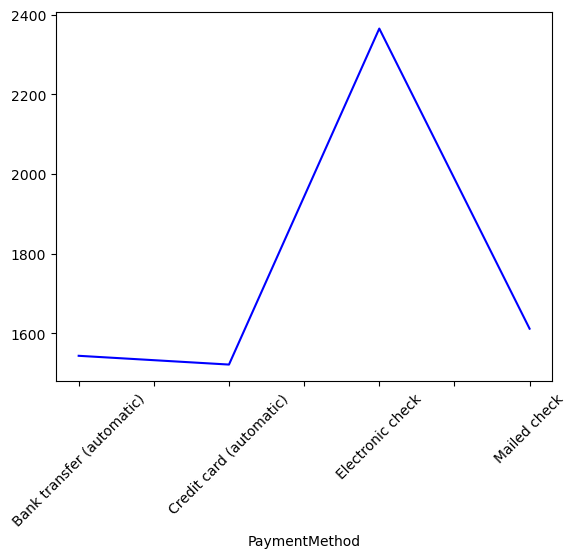

In [123]:
payment_method = df.groupby("PaymentMethod")["TotalCharges"].count() 
payment_method.plot()
plt.tick_params(axis='x', labelrotation=45)

## Factors inflencing churning

People on month to month contract have a higher chance of churning
Senior citizens have higher chance of churning (from the data 41% of senior citizens churned)
People with partners churn less

In [117]:
SC_churn = df.groupby(["Churn", "SeniorCitizen"])["TotalCharges"].count()
SC_churn.reset_index()

,Churn,SeniorCitizen,TotalCharges
0,0,0,4508
1,0,1,666
2,1,0,1393
3,1,1,476


In [118]:
Pa_churn = df.groupby(["Churn", "Partner"])["TotalCharges"].count()
Pa_churn.reset_index()

,Churn,Partner,TotalCharges
0,0,No,2441
1,0,Yes,2733
2,1,No,1200
3,1,Yes,669


In [120]:
De_churn = df.groupby(["Dependents", "Churn"])["TotalCharges"].count()
De_churn.reset_index()

,Dependents,Churn,TotalCharges
0,No,0,3390
1,No,1,1543
2,Yes,0,1784
3,Yes,1,326


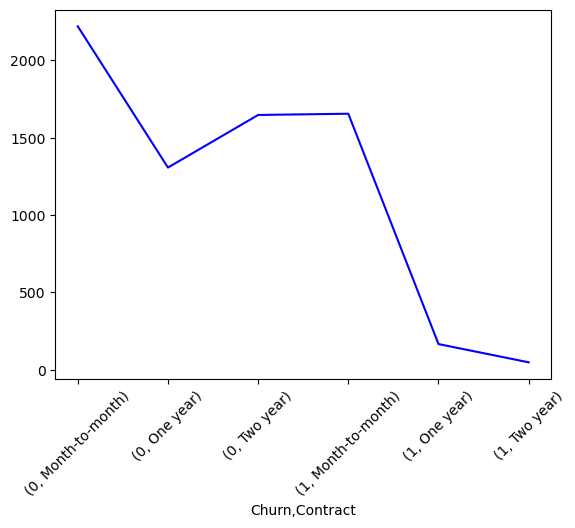

In [127]:
Contracttype = df.groupby(["Churn", "Contract"])["TotalCharges"].count()
Contracttype.plot(x=["Contract", "Churn"], y="TotalCharges")
plt.tick_params(axis='x', labelrotation=45)

# Feature Processing & Engineering
Here is the section to **clean**, **process** the dataset and **create new features**.

## Drop Duplicates

In [32]:
# Use pandas.DataFrame.drop_duplicates method

print("There are no duplicates in the data") if df_duplicate == 0 else print(f"'{df_duplicate}' duplicate rows in the data")

There are no duplicates in the data


## Impute Missing Values

In [33]:
# imputed already

## Check class imbalance

<Figure size 1000x800 with 0 Axes>

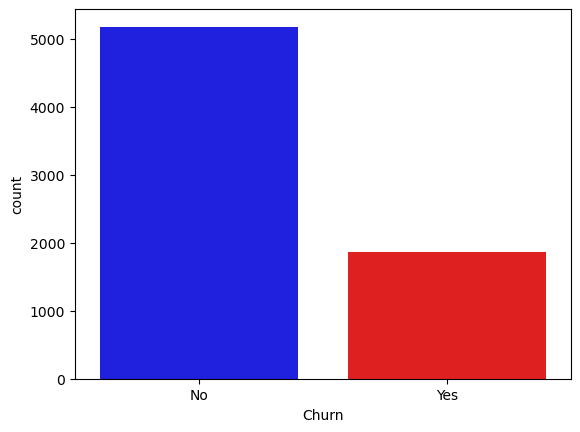

<Figure size 1000x800 with 0 Axes>

In [34]:
# class inbalance on churn column
colors = ["blue", "red",]
labels = ['No', 'Yes']
sns.set_palette(sns.color_palette(colors))
sns.countplot(df.Churn)
plt.figure(figsize=(10,8))

## New Features Creation

In [35]:
# Code here

#df["PhoneService"] = df.apply(lambda x: "MultipleLines" if x["MultipleLines"] == 'Yes' and x["PhoneService"] =="Yes" 
                             # else "SingleLine" if x["MultipleLines"] == "No" and x["PhoneService"] =="Yes"
                             # else "None", axis=1)
                               
#df["StreamingService"] = df.apply(lambda x: "Fullservice" if x["StreamingTV"] == "Yes" and x["StreamingMovies"] == "Yes"
                                 #else "None" if x["StreamingTV"] == "No" and x["StreamingMovies"] == "No"
                                # else "TV" if x["StreamingTV"] == "Yes" and x["StreamingMovies"] == "No"
                               #  else "Movies" if x["StreamingTV"] == "No" and x["StreamingMovies"] == "Yes" 
                                # else "NoInternet", axis=1)

#df["SecurityService"] = df.apply(lambda x: "Fullsecurity" if x["OnlineSecurity"] == "Yes" and x["DeviceProtection"] == "Yes"
                                # else "None" if x["OnlineSecurity"] == "No" and x["DeviceProtection"] == "No"
                                # else "Online" if x["OnlineSecurity"] == "Yes" and x["DeviceProtection"] == "No"
                                # else "Device" if x["OnlineSecurity"] == "No" and x["DeviceProtection"] == "Yes" 
                               #  else "NoInternet", axis=1)

In [36]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


## Features Encoding




In [37]:
# Convert columns to binary integers

df["Churn"].replace({"No":0, "Yes":1}, inplace=True)

In [38]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
df["Churn"] = label_encoder.fit_transform(df["Churn"])

In [39]:
# From sklearn.preprocessing use OneHotEncoder to encode the categorical features.

from sklearn.preprocessing import OneHotEncoder

cat_col = df[["Contract", "PaymentMethod", "gender", "Partner", "Dependents", "InternetService", "TechSupport", "OnlineBackup", "PhoneService","MultipleLines", "StreamingTV", "StreamingMovies", "OnlineSecurity", "DeviceProtection"]]

encoder = OneHotEncoder (drop = "first", sparse=False)
encoded_features = encoder.fit_transform(cat_col)

encoded_cat_col = pd.DataFrame(encoded_features, columns=encoder.get_feature_names())


In [40]:
encoded_cat_col.head()

,x0_One year,x0_Two year,x1_Credit card (automatic),x1_Electronic check,x1_Mailed check,x2_Male,x3_Yes,x4_Yes,x5_Fiber optic,x5_No,...,x9_No phone service,x9_Yes,x10_No internet service,x10_Yes,x11_No internet service,x11_Yes,x12_No internet service,x12_Yes,x13_No internet service,x13_Yes
0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [42]:
encoded_cat_col.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   x0_One year                 7043 non-null   float64
 1   x0_Two year                 7043 non-null   float64
 2   x1_Credit card (automatic)  7043 non-null   float64
 3   x1_Electronic check         7043 non-null   float64
 4   x1_Mailed check             7043 non-null   float64
 5   x2_Male                     7043 non-null   float64
 6   x3_Yes                      7043 non-null   float64
 7   x4_Yes                      7043 non-null   float64
 8   x5_Fiber optic              7043 non-null   float64
 9   x5_No                       7043 non-null   float64
 10  x6_No internet service      7043 non-null   float64
 11  x6_Yes                      7043 non-null   float64
 12  x7_No internet service      7043 non-null   float64
 13  x7_Yes                      7043 

In [43]:
# modify data by dropping columns used for encoding and other columns not necessary for modeling
# data with only numeric columns

mod_df = df.drop(["customerID", "PaperlessBilling", "Contract", "PaymentMethod", "gender", "Partner", "Dependents", "InternetService", "TechSupport", "OnlineBackup", "PhoneService","MultipleLines", "StreamingTV", "StreamingMovies", "OnlineSecurity", "DeviceProtection"], axis=1)
mod_df.head() 

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,Churn
0,0,1,29.85,29.85,0
1,0,34,56.95,1889.50,0
2,0,2,53.85,108.15,1
3,0,45,42.30,1840.75,0
4,0,2,70.70,151.65,1


In [44]:
# merge all data  
new_df = pd.concat([mod_df, encoded_cat_col], axis=1)
new_df.head()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,Churn,x0_One year,x0_Two year,x1_Credit card (automatic),x1_Electronic check,x1_Mailed check,...,x9_No phone service,x9_Yes,x10_No internet service,x10_Yes,x11_No internet service,x11_Yes,x12_No internet service,x12_Yes,x13_No internet service,x13_Yes
0,0,1,29.85,29.85,0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,34,56.95,1889.50,0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2,0,2,53.85,108.15,1,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0,45,42.30,1840.75,0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
4,0,2,70.70,151.65,1,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [45]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   SeniorCitizen               7043 non-null   int64  
 1   tenure                      7043 non-null   int64  
 2   MonthlyCharges              7043 non-null   float64
 3   TotalCharges                7043 non-null   float64
 4   Churn                       7043 non-null   int64  
 5   x0_One year                 7043 non-null   float64
 6   x0_Two year                 7043 non-null   float64
 7   x1_Credit card (automatic)  7043 non-null   float64
 8   x1_Electronic check         7043 non-null   float64
 9   x1_Mailed check             7043 non-null   float64
 10  x2_Male                     7043 non-null   float64
 11  x3_Yes                      7043 non-null   float64
 12  x4_Yes                      7043 non-null   float64
 13  x5_Fiber optic              7043 

## Features Scaling


In [46]:
# scale data without encoded categorical features

train_num_columns = new_df[["tenure", "MonthlyCharges", "TotalCharges"]]

In [47]:
from sklearn.preprocessing import StandardScaler

scaled_data = StandardScaler().fit_transform(train_num_columns)
scaled_mod_df = pd.DataFrame(data = scaled_data)
scaled_mod_df.columns = train_num_columns.columns.values

In [48]:
scaled_mod_df

,tenure,MonthlyCharges,TotalCharges
0,-1.277445,-1.160323,-0.994242
1,0.066327,-0.259629,-0.173244
2,-1.236724,-0.362660,-0.959674
3,0.514251,-0.746535,-0.194766
4,-1.236724,0.197365,-0.940470
5,-0.992402,1.159546,-0.645186
6,-0.422317,0.808907,-0.146799
7,-0.910961,-1.163647,-0.874137
8,-0.177995,1.330711,0.337349
9,1.206498,-0.286218,0.532439


In [49]:
new_df1 = new_df.drop(["tenure", "MonthlyCharges", "TotalCharges"], axis=1)
new_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 27 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   SeniorCitizen               7043 non-null   int64  
 1   Churn                       7043 non-null   int64  
 2   x0_One year                 7043 non-null   float64
 3   x0_Two year                 7043 non-null   float64
 4   x1_Credit card (automatic)  7043 non-null   float64
 5   x1_Electronic check         7043 non-null   float64
 6   x1_Mailed check             7043 non-null   float64
 7   x2_Male                     7043 non-null   float64
 8   x3_Yes                      7043 non-null   float64
 9   x4_Yes                      7043 non-null   float64
 10  x5_Fiber optic              7043 non-null   float64
 11  x5_No                       7043 non-null   float64
 12  x6_No internet service      7043 non-null   float64
 13  x6_Yes                      7043 

In [50]:
scaled_train_fulldf = pd.concat([new_df1, scaled_mod_df], axis=1)
scaled_train_fulldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   SeniorCitizen               7043 non-null   int64  
 1   Churn                       7043 non-null   int64  
 2   x0_One year                 7043 non-null   float64
 3   x0_Two year                 7043 non-null   float64
 4   x1_Credit card (automatic)  7043 non-null   float64
 5   x1_Electronic check         7043 non-null   float64
 6   x1_Mailed check             7043 non-null   float64
 7   x2_Male                     7043 non-null   float64
 8   x3_Yes                      7043 non-null   float64
 9   x4_Yes                      7043 non-null   float64
 10  x5_Fiber optic              7043 non-null   float64
 11  x5_No                       7043 non-null   float64
 12  x6_No internet service      7043 non-null   float64
 13  x6_Yes                      7043 

## Dataset Splitting

In [51]:
# split train data into train and evaluation set

X = scaled_train_fulldf.drop(["Churn"], axis =1, inplace=False)
y = scaled_train_fulldf["Churn"]

from sklearn.model_selection import train_test_split

X_train, X_eval, y_train, y_eval = train_test_split(X,y, test_size = 0.2, random_state = 42)

In [52]:
X_train.shape, X_eval.shape, y_train.shape, y_eval.shape

((5634, 29), (1409, 29), (5634,), (1409,))

## Optional: Train Dataset Balancing 

In [53]:
# Use Over-sampling/Under-sampling methods, more details here: https://imbalanced-learn.org/stable/install.html

#from imblearn.over_sampling import SMOTE
#smote = SMOTE(random_state=27, sampling_strategy=1.0)
#T_train_bal, V_train_bal = sm.fit_resample(T_train, V_train)

# Machine Learning Modeling 
Here is the section to **build**, **train**, **evaluate** and **compare** the models to each others.

## Logistic Regression

Please, keep the following structure to try all the model you want.

### Create and train the Model

In [54]:
#np.any(np.isnan(train_df))

NameError: name 'train_df' is not defined

In [ ]:
#np.all(np.isfinite(train_df))

In [55]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, fbeta_score

logreg = LogisticRegression()
logreg.fit(X_train, y_train)

LogisticRegression()

### Predict and evaluate the Model on the Evaluation dataset (Evalset)

In [56]:
# Compute the valid metrics for the use case # Optional: show the classification report
from sklearn.metrics import f1_score

# Predicting the Test set results
log_pred  = logreg.predict(X_eval)

#Evaluate results
acc_score = accuracy_score(y_eval, log_pred)
pre_score = precision_score(y_eval, log_pred)
rec_score = recall_score(y_eval, log_pred )
f1_score = f1_score(y_eval, log_pred )
f2_score = fbeta_score(y_eval, log_pred, beta=2.0)

df_model_result = pd.DataFrame([["Logistic Regression", acc_score, pre_score, rec_score, f1_score, f2_score]], columns = ["Model", "Accuracy", "Precision", "Recall", "F1 Score", "F2 Score"])
df_model_result

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score
0,Logistic Regression,0.811214,0.662614,0.58445,0.621083,0.598572


## K Nearest Neighbour 

### Create and train the Model

In [57]:
# Code here
from sklearn.neighbors import KNeighborsClassifier

KNN = KNeighborsClassifier(n_neighbors = 3)
KNN.fit(X_train, y_train)


KNeighborsClassifier(n_neighbors=3)

### Predict and evaluate the Model on the Evaluation dataset (Evalset)

In [58]:
# Predicting the Test set results
KNN_pred  = KNN.predict(X_eval)

#Evaluate results
acc_score = accuracy_score(y_eval, KNN_pred)
pre_score = precision_score(y_eval, KNN_pred)
rec_score = recall_score(y_eval, KNN_pred)
f1_score = sklearn.metrics.f1_score(y_eval, KNN_pred)
f2_score = fbeta_score(y_eval, KNN_pred, beta=2.0)

model_results = pd.DataFrame([["KNN", acc_score, pre_score, rec_score, f1_score, f2_score]], columns = ["Model", "Accuracy", "Precision", "Recall", "F1 Score", "F2 Score"])
df_model_results = df_model_result.append(model_results, ignore_index = True)
df_model_results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score
0,Logistic Regression,0.811214,0.662614,0.584450,0.621083,0.598572
1,KNN,0.757275,0.545994,0.493298,0.518310,0.503007


## Decision Tree

### Create and train the Model

In [59]:
from sklearn.tree import DecisionTreeClassifier
# Fitting Decision Tree to the Training set

dec_tree = DecisionTreeClassifier()
dec_tree.fit(X_train, y_train)

DecisionTreeClassifier()

### Predict and evaluate the Model on the Evaluation dataset (Evalset)

In [60]:
# Predicting the Test set results
tree_pred  = dec_tree.predict(X_eval)

#Evaluate results
acc_score = accuracy_score(y_eval, tree_pred)
pre_score = precision_score(y_eval, tree_pred)
rec_score = recall_score(y_eval, tree_pred)
f1_score = sklearn.metrics.f1_score(y_eval, tree_pred)
f2_score = fbeta_score(y_eval, tree_pred, beta=2.0)

model_results = pd.DataFrame([["Decision Tree", acc_score, pre_score, rec_score, f1_score, f2_score]], columns = ["Model", "Accuracy", "Precision", "Recall", "F1 Score", "F2 Score"])
df_model_results = df_model_results.append(model_results, ignore_index = True)
df_model_results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score
0,Logistic Regression,0.811214,0.662614,0.584450,0.621083,0.598572
1,KNN,0.757275,0.545994,0.493298,0.518310,0.503007
2,Decision Tree,0.704755,0.444444,0.461126,0.452632,0.457690


## Xg Boost

### Create and train the Model

In [61]:
from sklearn.ensemble import GradientBoostingClassifier

xgc = GradientBoostingClassifier(n_estimators=500, max_depth=5, random_state=42) 
xgc.fit(X_train, y_train)

GradientBoostingClassifier(max_depth=5, n_estimators=500, random_state=42)

### Predict and evaluate the Model on the Evaluation dataset (Evalset)

In [62]:
# Predicting the Test set results
xgc_pred  = xgc.predict(X_eval)

#Evaluate results
acc_score = accuracy_score(y_eval, xgc_pred)
pre_score = precision_score(y_eval, xgc_pred)
rec_score = recall_score(y_eval, xgc_pred)
f1_score = sklearn.metrics.f1_score(y_eval, xgc_pred)
f2_score = fbeta_score(y_eval, xgc_pred, beta=2.0)

model_results = pd.DataFrame([["XGB Classifier", acc_score, pre_score, rec_score, f1_score, f2_score]], columns = ["Model", "Accuracy", "Precision", "Recall", "F1 Score", "F2 Score"])
df_model_results = df_model_results.append(model_results, ignore_index = True)
df_model_results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score
0,Logistic Regression,0.811214,0.662614,0.584450,0.621083,0.598572
1,KNN,0.757275,0.545994,0.493298,0.518310,0.503007
2,Decision Tree,0.704755,0.444444,0.461126,0.452632,0.457690
3,XGB Classifier,0.793471,0.639456,0.504021,0.563718,0.526316


## Random Forest Classifier

### Create and train the Model

In [63]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)

RandomForestClassifier()

### Predict and evaluate the Model on the Evaluation dataset (Evalset)

In [64]:
# Predicting the Test set results
rfc_pred  = rfc.predict(X_eval)

#Evaluate results
acc_score = accuracy_score(y_eval, rfc_pred)
pre_score = precision_score(y_eval, rfc_pred)
rec_score = recall_score(y_eval, rfc_pred)
f1_score = sklearn.metrics.f1_score(y_eval, rfc_pred)
f2_score = fbeta_score(y_eval, rfc_pred, beta=2.0)

model_results = pd.DataFrame([["Random Forest", acc_score, pre_score, rec_score, f1_score, f2_score]], columns = ["Model", "Accuracy", "Precision", "Recall", "F1 Score", "F2 Score"])
df_model_results = df_model_results.append(model_results, ignore_index = True)
df_model_results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score
0,Logistic Regression,0.811214,0.662614,0.584450,0.621083,0.598572
1,KNN,0.757275,0.545994,0.493298,0.518310,0.503007
2,Decision Tree,0.704755,0.444444,0.461126,0.452632,0.457690
3,XGB Classifier,0.793471,0.639456,0.504021,0.563718,0.526316
4,Random Forest,0.795600,0.661597,0.466488,0.547170,0.495726


## Models comparison
Create a pandas dataframe that will allow you to compare your models.

Find a sample frame below :

|     | Model_Name     | Metric (metric_name)    | Details  |
|:---:|:--------------:|:--------------:|:-----------------:|
| 0   |  -             |  -             | -                 |
| 1   |  -             |  -             | -                 |


You might use the pandas dataframe method `.sort_values()` to sort the dataframe regarding the metric.

In [65]:
model_select = df_model_results[["Model", "F1 Score"]].sort_values(by="F1 Score", ascending=False)
model_select                               

,Model,F1 Score
0,Logistic Regression,0.621083
3,XGB Classifier,0.563718
4,Random Forest,0.547170
1,KNN,0.518310
2,Decision Tree,0.452632


## Hyperparameters tuning 

Fine-tune the Top-k models (3 < k < 5) using a ` GridSearchCV`  (that is in sklearn.model_selection
) to find the best hyperparameters and achieve the maximum performance of each of the Top-k models, then compare them again to select the best one.

### Hypertune best model 1

In [66]:
model_1 = model_select.iloc[[0], [0]]
model_1

,Model
0,Logistic Regression


In [67]:
# Code here
logreg.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [75]:
parameters = {
  'C':[2, 10],
  'solver' : ['newton-cg', 'newton-cholesky', 'sag'],  
  'max_iter': [120, 200, 250], 
  'class_weight': ['balanced'],
  'random_state': [10, 25, 40],
  'multi_class': ['auto', 'ovr', 'multinomial'],
}

In [76]:
# instantiate the Searcher
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, fbeta_score

searcher = GridSearchCV(
    estimator=logreg,
    param_grid=parameters,
    scoring=["accuracy", "precision", "recall", "f1"], 
    refit="f1", 
    cv=5,  
    verbose=3 
)

In [77]:
searcher.fit(X_train, y_train)

Fitting 5 folds for each of 162 candidates, totalling 810 fits
[CV 1/5] END C=2, class_weight=balanced, max_iter=120, multi_class=auto, random_state=10, solver=newton-cg; accuracy: (test=0.751) f1: (test=0.646) precision: (test=0.518) recall: (test=0.856) total time=   0.0s
[CV 2/5] END C=2, class_weight=balanced, max_iter=120, multi_class=auto, random_state=10, solver=newton-cg; accuracy: (test=0.734) f1: (test=0.612) precision: (test=0.499) recall: (test=0.793) total time=   0.0s
[CV 3/5] END C=2, class_weight=balanced, max_iter=120, multi_class=auto, random_state=10, solver=newton-cg; accuracy: (test=0.736) f1: (test=0.615) precision: (test=0.501) recall: (test=0.796) total time=   0.0s
[CV 4/5] END C=2, class_weight=balanced, max_iter=120, multi_class=auto, random_state=10, solver=newton-cg; accuracy: (test=0.728) f1: (test=0.610) precision: (test=0.493) recall: (test=0.800) total time=   0.0s
[CV 5/5] END C=2, class_weight=balanced, max_iter=120, multi_class=auto, random_state=10,

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [2, 10], 'class_weight': ['balanced'],
                         'max_iter': [120, 200, 250],
                         'multi_class': ['auto', 'ovr', 'multinomial'],
                         'random_state': [10, 25, 40],
                         'solver': ['newton-cg', 'newton-cholesky', 'sag']},
             refit='f1', scoring=['accuracy', 'precision', 'recall', 'f1'],
             verbose=3)

In [78]:
search_hist = pd.DataFrame(searcher.cv_results_)
search_hist

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_class_weight,param_max_iter,param_multi_class,param_random_state,param_solver,...,std_test_recall,rank_test_recall,split0_test_f1,split1_test_f1,split2_test_f1,split3_test_f1,split4_test_f1,mean_test_f1,std_test_f1,rank_test_f1
0,0.076693,0.012754,0.005693,0.005898,2,balanced,120,auto,10,newton-cg,...,0.034071,73,0.645649,0.612403,0.614987,0.609911,0.613699,0.619330,0.013266,73
1,0.002744,0.005489,0.000000,0.000000,2,balanced,120,auto,10,newton-cholesky,...,NaN,128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,128
2,0.242983,0.015892,0.007434,0.004964,2,balanced,120,auto,10,sag,...,0.034071,73,0.645649,0.612403,0.614987,0.609911,0.613699,0.619330,0.013266,73
3,0.086358,0.014293,0.005190,0.002720,2,balanced,120,auto,25,newton-cg,...,0.034071,73,0.645649,0.612403,0.614987,0.609911,0.613699,0.619330,0.013266,73
4,0.001082,0.001905,0.000000,0.000000,2,balanced,120,auto,25,newton-cholesky,...,NaN,125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,125
5,0.252162,0.020381,0.006991,0.004002,2,balanced,120,auto,25,sag,...,0.034071,73,0.645649,0.612403,0.614987,0.609911,0.613699,0.619330,0.013266,73
6,0.077189,0.006015,0.009614,0.002489,2,balanced,120,auto,40,newton-cg,...,0.034071,73,0.645649,0.612403,0.614987,0.609911,0.613699,0.619330,0.013266,73
7,0.001232,0.001062,0.000000,0.000000,2,balanced,120,auto,40,newton-cholesky,...,NaN,121,NaN,NaN,NaN,NaN,NaN,NaN,NaN,121
8,0.245678,0.022298,0.009170,0.002680,2,balanced,120,auto,40,sag,...,0.034071,73,0.645649,0.612403,0.614987,0.609911,0.613699,0.619330,0.013266,73
9,0.071763,0.013393,0.007621,0.001663,2,balanced,120,ovr,10,newton-cg,...,0.034071,73,0.645649,0.612403,0.614987,0.609911,0.613699,0.619330,0.013266,73


In [79]:
searcher.best_params_

{'C': 10,
 'class_weight': 'balanced',
 'max_iter': 120,
 'multi_class': 'auto',
 'random_state': 10,
 'solver': 'newton-cg'}

In [73]:
searcher.best_estimator_

LogisticRegression(C=10, class_weight='balanced', max_iter=120, random_state=10,
                   solver='newton-cg')

In [74]:
logreg1 = searcher.best_estimator_
logreg1.fit(X_train, y_train)

log1_pred  = logreg1.predict(X_eval)

#Evaluate results
acc_score = accuracy_score(y_eval, log1_pred)
pre_score = precision_score(y_eval, log1_pred)
rec_score = recall_score(y_eval, log1_pred )
f1_score = sklearn.metrics.f1_score(y_eval, log1_pred )
f2_score = fbeta_score(y_eval, log1_pred, beta=2.0)

model_results = pd.DataFrame([["Logistic Regression1", acc_score, pre_score, rec_score, f1_score, f2_score]], columns = ["Model", "Accuracy", "Precision", "Recall", "F1 Score", "F2 Score"])
df_model_results = df_model_results.append(model_results, ignore_index = True)
df_model_results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score
0,Logistic Regression,0.811214,0.662614,0.584450,0.621083,0.598572
1,KNN,0.757275,0.545994,0.493298,0.518310,0.503007
2,Decision Tree,0.704755,0.444444,0.461126,0.452632,0.457690
3,XGB Classifier,0.793471,0.639456,0.504021,0.563718,0.526316
4,Random Forest,0.795600,0.661597,0.466488,0.547170,0.495726
5,Logistic Regression1,0.753016,0.521079,0.828418,0.639752,0.741007


### Hypertune best model 2 (KNN)

In [80]:
KNN.get_params

<bound method BaseEstimator.get_params of KNeighborsClassifier(n_neighbors=3)>

In [81]:
KNN.get_params().keys()

dict_keys(['algorithm', 'leaf_size', 'metric', 'metric_params', 'n_jobs', 'n_neighbors', 'p', 'weights'])

In [82]:
parameters = {
    'n_neighbors': [2, 5, 7],
    'algorithm': ['ball_tree', 'kd_tree', 'brute'], 
    'leaf_size': [10, 15, 20],
}

In [83]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, fbeta_score

search = GridSearchCV(
    estimator=KNN,
    param_grid=parameters,
    scoring=["accuracy", "precision", "recall", "f1"], 
    refit="f1", 
    cv=5,  
    verbose=3 
)

In [84]:
search.fit(X_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV 1/5] END algorithm=ball_tree, leaf_size=10, n_neighbors=2; accuracy: (test=0.759) f1: (test=0.404) precision: (test=0.586) recall: (test=0.308) total time=   0.2s
[CV 2/5] END algorithm=ball_tree, leaf_size=10, n_neighbors=2; accuracy: (test=0.744) f1: (test=0.366) precision: (test=0.535) recall: (test=0.278) total time=   0.1s
[CV 3/5] END algorithm=ball_tree, leaf_size=10, n_neighbors=2; accuracy: (test=0.746) f1: (test=0.370) precision: (test=0.542) recall: (test=0.281) total time=   0.1s
[CV 4/5] END algorithm=ball_tree, leaf_size=10, n_neighbors=2; accuracy: (test=0.750) f1: (test=0.384) precision: (test=0.557) recall: (test=0.293) total time=   0.1s
[CV 5/5] END algorithm=ball_tree, leaf_size=10, n_neighbors=2; accuracy: (test=0.754) f1: (test=0.383) precision: (test=0.573) recall: (test=0.288) total time=   0.1s
[CV 1/5] END algorithm=ball_tree, leaf_size=10, n_neighbors=5; accuracy: (test=0.771) f1: (test=0.569) 

GridSearchCV(cv=5, estimator=KNeighborsClassifier(n_neighbors=3),
             param_grid={'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [10, 15, 20], 'n_neighbors': [2, 5, 7]},
             refit='f1', scoring=['accuracy', 'precision', 'recall', 'f1'],
             verbose=3)

In [85]:
search_hist1 = pd.DataFrame(search.cv_results_)
search_hist1

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_algorithm,param_leaf_size,param_n_neighbors,params,split0_test_accuracy,split1_test_accuracy,...,std_test_recall,rank_test_recall,split0_test_f1,split1_test_f1,split2_test_f1,split3_test_f1,split4_test_f1,mean_test_f1,std_test_f1,rank_test_f1
0,0.033474,0.014504,0.183962,0.014254,ball_tree,10,2,"{'algorithm': 'ball_tree', 'leaf_size': 10, 'n...",0.758651,0.744454,...,0.010623,19,0.403509,0.365639,0.370044,0.384279,0.383073,0.381309,0.013246,19
1,0.028361,0.003406,0.230826,0.024425,ball_tree,10,5,"{'algorithm': 'ball_tree', 'leaf_size': 10, 'n...",0.771074,0.763088,...,0.033768,13,0.568562,0.525755,0.508834,0.533563,0.516364,0.530615,0.020735,13
2,0.024097,0.006568,0.233672,0.011012,ball_tree,10,7,"{'algorithm': 'ball_tree', 'leaf_size': 10, 'n...",0.775510,0.775510,...,0.039504,6,0.567521,0.549020,0.527828,0.574359,0.510319,0.545809,0.023999,3
3,0.023014,0.006918,0.188146,0.007680,ball_tree,15,2,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",0.758651,0.744454,...,0.010623,19,0.403509,0.365639,0.370044,0.384279,0.383073,0.381309,0.013246,19
4,0.023856,0.006394,0.204137,0.018390,ball_tree,15,5,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",0.771074,0.763088,...,0.033768,13,0.568562,0.525755,0.508834,0.533563,0.516364,0.530615,0.020735,13
5,0.025438,0.004437,0.209121,0.008640,ball_tree,15,7,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",0.775510,0.775510,...,0.039504,6,0.567521,0.549020,0.527828,0.574359,0.510319,0.545809,0.023999,3
6,0.018410,0.002703,0.174765,0.010328,ball_tree,20,2,"{'algorithm': 'ball_tree', 'leaf_size': 20, 'n...",0.758651,0.744454,...,0.010623,19,0.403509,0.365639,0.370044,0.384279,0.383073,0.381309,0.013246,19
7,0.019293,0.006515,0.194564,0.009037,ball_tree,20,5,"{'algorithm': 'ball_tree', 'leaf_size': 20, 'n...",0.771074,0.763088,...,0.034300,17,0.568562,0.525755,0.507092,0.533563,0.516364,0.530267,0.021110,17
8,0.020972,0.002299,0.188971,0.013356,ball_tree,20,7,"{'algorithm': 'ball_tree', 'leaf_size': 20, 'n...",0.775510,0.775510,...,0.039124,1,0.567521,0.549020,0.529517,0.574359,0.510319,0.546147,0.023754,1
9,0.037316,0.020193,0.123858,0.008391,kd_tree,10,2,"{'algorithm': 'kd_tree', 'leaf_size': 10, 'n_n...",0.758651,0.744454,...,0.010623,19,0.403509,0.365639,0.370044,0.384279,0.383073,0.381309,0.013246,19


In [86]:
search.best_params_

{'algorithm': 'ball_tree', 'leaf_size': 20, 'n_neighbors': 7}

In [87]:
search.best_estimator_

KNeighborsClassifier(algorithm='ball_tree', leaf_size=20, n_neighbors=7)

In [88]:
KNN1 = search.best_estimator_
KNN1.fit(X_train, y_train)

KNN1_pred  = KNN1.predict(X_eval)

#Evaluate results
acc_score = accuracy_score(y_eval, KNN1_pred)
pre_score = precision_score(y_eval, KNN1_pred)
rec_score = recall_score(y_eval, KNN1_pred )
f1_score = sklearn.metrics.f1_score(y_eval, KNN1_pred )
f2_score = fbeta_score(y_eval, KNN1_pred, beta=2.0)

model_results = pd.DataFrame([["KNN1", acc_score, pre_score, rec_score, f1_score, f2_score]], columns = ["Model", "Accuracy", "Precision", "Recall", "F1 Score", "F2 Score"])
df_model_results = df_model_results.append(model_results, ignore_index = True)
df_model_results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score
0,Logistic Regression,0.811214,0.662614,0.584450,0.621083,0.598572
1,KNN,0.757275,0.545994,0.493298,0.518310,0.503007
2,Decision Tree,0.704755,0.444444,0.461126,0.452632,0.457690
3,XGB Classifier,0.793471,0.639456,0.504021,0.563718,0.526316
4,Random Forest,0.795600,0.661597,0.466488,0.547170,0.495726
5,Logistic Regression1,0.753016,0.521079,0.828418,0.639752,0.741007
6,KNN1,0.784954,0.604790,0.541555,0.571429,0.553122


### Hypertune best model 3 (XGB Classifier)

In [89]:
xgc.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'deviance',
 'max_depth': 5,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 500,
 'n_iter_no_change': None,
 'random_state': 42,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [90]:
parameters = {
    'n_estimators': [100, 200],
    'random_state': [10, 20],
    'max_depth': [4, 6],
    'max_features': [2, 5],
    'min_impurity_decrease': [1.0], 
    'min_samples_leaf': [4, 5],
    'min_samples_split': [2, 5],
}

In [91]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, fbeta_score

search = GridSearchCV(
    estimator=xgc,
    param_grid=parameters,
    scoring=["accuracy", "precision", "recall", "f1"], 
    refit="f1", 
    cv=5,  
    verbose=3 
)

In [92]:
search.fit(X_train, y_train)

Fitting 5 folds for each of 64 candidates, totalling 320 fits
[CV 1/5] END max_depth=4, max_features=2, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=10; accuracy: (test=0.812) f1: (test=0.581) precision: (test=0.710) recall: (test=0.492) total time=   0.1s
[CV 2/5] END max_depth=4, max_features=2, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=10; accuracy: (test=0.800) f1: (test=0.549) precision: (test=0.685) recall: (test=0.458) total time=   0.1s
[CV 3/5] END max_depth=4, max_features=2, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=10; accuracy: (test=0.796) f1: (test=0.549) precision: (test=0.664) recall: (test=0.468) total time=   0.1s
[CV 4/5] END max_depth=4, max_features=2, min_impurity_decrease=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=10; accuracy: (test=0.786) f1: (test=0.541) precis

GridSearchCV(cv=5,
             estimator=GradientBoostingClassifier(max_depth=5, n_estimators=500,
                                                  random_state=42),
             param_grid={'max_depth': [4, 6], 'max_features': [2, 5],
                         'min_impurity_decrease': [1.0],
                         'min_samples_leaf': [4, 5],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200], 'random_state': [10, 20]},
             refit='f1', scoring=['accuracy', 'precision', 'recall', 'f1'],
             verbose=3)

In [93]:
search_hist1 = pd.DataFrame(search.cv_results_)
search_hist1

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_min_impurity_decrease,param_min_samples_leaf,param_min_samples_split,param_n_estimators,...,std_test_recall,rank_test_recall,split0_test_f1,split1_test_f1,split2_test_f1,split3_test_f1,split4_test_f1,mean_test_f1,std_test_f1,rank_test_f1
0,0.168456,0.013546,0.011536,0.004273,4,2,1.0,4,2,100,...,0.029349,57,0.581028,0.549098,0.549020,0.540952,0.510549,0.546129,0.022485,51
1,0.186374,0.012719,0.009929,0.005841,4,2,1.0,4,2,100,...,0.029047,45,0.574757,0.559524,0.558767,0.532567,0.512500,0.547623,0.022192,45
2,0.305901,0.019308,0.009655,0.007155,4,2,1.0,4,2,200,...,0.030541,41,0.585271,0.553106,0.558140,0.544090,0.519916,0.552105,0.021156,41
3,0.276929,0.013213,0.012913,0.002924,4,2,1.0,4,2,200,...,0.030644,39,0.579151,0.572549,0.560461,0.538168,0.512397,0.552545,0.024451,39
4,0.165257,0.013317,0.010232,0.001632,4,2,1.0,4,5,100,...,0.029349,57,0.581028,0.549098,0.549020,0.540952,0.510549,0.546129,0.022485,51
5,0.160064,0.018049,0.006037,0.005799,4,2,1.0,4,5,100,...,0.029047,45,0.574757,0.559524,0.558767,0.532567,0.512500,0.547623,0.022192,45
6,0.256579,0.009130,0.014034,0.002871,4,2,1.0,4,5,200,...,0.030541,41,0.585271,0.553106,0.558140,0.544090,0.519916,0.552105,0.021156,41
7,0.276964,0.023377,0.006295,0.004114,4,2,1.0,4,5,200,...,0.030644,39,0.579151,0.572549,0.560461,0.538168,0.512397,0.552545,0.024451,39
8,0.144765,0.004590,0.004468,0.003975,4,2,1.0,5,2,100,...,0.029349,57,0.579882,0.549098,0.549020,0.540952,0.510549,0.545900,0.022131,53
9,0.121966,0.005194,0.004186,0.003740,4,2,1.0,5,2,100,...,0.029047,45,0.574757,0.559524,0.558767,0.532567,0.512500,0.547623,0.022192,45


In [94]:
search.best_params_

{'max_depth': 6,
 'max_features': 5,
 'min_impurity_decrease': 1.0,
 'min_samples_leaf': 4,
 'min_samples_split': 2,
 'n_estimators': 100,
 'random_state': 10}

In [95]:
search.best_estimator_

GradientBoostingClassifier(max_depth=6, max_features=5,
                           min_impurity_decrease=1.0, min_samples_leaf=4,
                           random_state=10)

In [96]:
xgc1 = search.best_estimator_
xgc1.fit(X_train, y_train)

xgc1_pred  = xgc1.predict(X_eval)

#Evaluate results
acc_score = accuracy_score(y_eval, xgc1_pred)
pre_score = precision_score(y_eval, xgc1_pred)
rec_score = recall_score(y_eval, xgc1_pred )
f1_score = sklearn.metrics.f1_score(y_eval, xgc1_pred )
f2_score = fbeta_score(y_eval, xgc1_pred, beta=2.0)

model_results = pd.DataFrame([["XG BOOST1", acc_score, pre_score, rec_score, f1_score, f2_score]], columns = ["Model", "Accuracy", "Precision", "Recall", "F1 Score", "F2 Score"])
df_model_results = df_model_results.append(model_results, ignore_index = True)
df_model_results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score
0,Logistic Regression,0.811214,0.662614,0.584450,0.621083,0.598572
1,KNN,0.757275,0.545994,0.493298,0.518310,0.503007
2,Decision Tree,0.704755,0.444444,0.461126,0.452632,0.457690
3,XGB Classifier,0.793471,0.639456,0.504021,0.563718,0.526316
4,Random Forest,0.795600,0.661597,0.466488,0.547170,0.495726
5,Logistic Regression1,0.753016,0.521079,0.828418,0.639752,0.741007
6,KNN1,0.784954,0.604790,0.541555,0.571429,0.553122
7,XG BOOST1,0.811214,0.687719,0.525469,0.595745,0.551491


### Hypertune best model 4 (Random Forest Classifier)

In [97]:
rfc.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [98]:

parameters = {
    'criterion': ["gini","entropy"],
    'random_state': [10],
    'min_samples_leaf': [1, 2],
    'min_samples_split': [2, 5],
    'n_estimators': [200, 300, 400],
}
     

In [99]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, fbeta_score

searcher2 = GridSearchCV(
    estimator=rfc,
    param_grid=parameters,
    scoring=["accuracy", "precision", "recall", "f1"], 
    refit="f1", 
    cv=5,  
    verbose=3 
)

In [100]:
searcher2.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END criterion=gini, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=10; accuracy: (test=0.794) f1: (test=0.587) precision: (test=0.627) recall: (test=0.552) total time=   1.9s
[CV 2/5] END criterion=gini, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=10; accuracy: (test=0.790) f1: (test=0.538) precision: (test=0.645) recall: (test=0.462) total time=   1.3s
[CV 3/5] END criterion=gini, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=10; accuracy: (test=0.776) f1: (test=0.523) precision: (test=0.603) recall: (test=0.462) total time=   1.4s
[CV 4/5] END criterion=gini, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=10; accuracy: (test=0.791) f1: (test=0.556) precision: (test=0.642) recall: (test=0.490) total time=   1.5s
[CV 5/5] END criterion=gini, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=1

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5],
                         'n_estimators': [200, 300, 400],
                         'random_state': [10]},
             refit='f1', scoring=['accuracy', 'precision', 'recall', 'f1'],
             verbose=3)

In [101]:
searcher2_hist1 = pd.DataFrame(searcher2.cv_results_)
searcher2_hist1

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_min_samples_leaf,param_min_samples_split,param_n_estimators,param_random_state,params,...,std_test_recall,rank_test_recall,split0_test_f1,split1_test_f1,split2_test_f1,split3_test_f1,split4_test_f1,mean_test_f1,std_test_f1,rank_test_f1
0,1.501105,0.227117,0.088718,0.008581,gini,1,2,200,10,"{'criterion': 'gini', 'min_samples_leaf': 1, '...",...,0.040739,23,0.587189,0.538012,0.522727,0.555766,0.505882,0.541915,0.028012,24
1,1.518110,0.223744,0.087452,0.014390,gini,1,2,300,10,"{'criterion': 'gini', 'min_samples_leaf': 1, '...",...,0.037298,22,0.581688,0.551456,0.515038,0.562264,0.508876,0.543864,0.027864,22
2,1.853330,0.071954,0.107308,0.007299,gini,1,2,400,10,"{'criterion': 'gini', 'min_samples_leaf': 1, '...",...,0.033519,20,0.578097,0.562016,0.526316,0.549242,0.511811,0.545496,0.023884,21
3,0.849416,0.014960,0.052093,0.003603,gini,1,5,200,10,"{'criterion': 'gini', 'min_samples_leaf': 1, '...",...,0.040223,8,0.600000,0.554028,0.524904,0.563910,0.534653,0.555499,0.026168,12
4,1.258511,0.051784,0.078439,0.010435,gini,1,5,300,10,"{'criterion': 'gini', 'min_samples_leaf': 1, '...",...,0.039709,11,0.600000,0.548323,0.530534,0.557439,0.534653,0.554190,0.024839,16
5,1.683468,0.072274,0.101891,0.004660,gini,1,5,400,10,"{'criterion': 'gini', 'min_samples_leaf': 1, '...",...,0.038975,13,0.594982,0.562500,0.531549,0.560606,0.526104,0.555148,0.024783,14
6,0.805542,0.013460,0.044816,0.005303,gini,2,2,200,10,"{'criterion': 'gini', 'min_samples_leaf': 2, '...",...,0.043215,3,0.610413,0.578125,0.534351,0.556391,0.526104,0.561077,0.030607,4
7,1.285696,0.065819,0.117716,0.046668,gini,2,2,300,10,"{'criterion': 'gini', 'min_samples_leaf': 2, '...",...,0.041992,1,0.610108,0.583012,0.541267,0.559099,0.528226,0.564342,0.029351,1
8,1.599046,0.005936,0.094900,0.006637,gini,2,2,400,10,"{'criterion': 'gini', 'min_samples_leaf': 2, '...",...,0.037296,2,0.600362,0.573643,0.545106,0.568738,0.531187,0.563807,0.023963,2
9,0.853755,0.076218,0.053551,0.002823,gini,2,5,200,10,"{'criterion': 'gini', 'min_samples_leaf': 2, '...",...,0.045313,10,0.609319,0.562500,0.533589,0.549533,0.520161,0.555020,0.030688,15


In [102]:
searcher2.best_params_

{'criterion': 'gini',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 300,
 'random_state': 10}

In [103]:
searcher2.best_estimator_

RandomForestClassifier(min_samples_leaf=2, n_estimators=300, random_state=10)

In [104]:
rfc1 = searcher2.best_estimator_
rfc1.fit(X_train, y_train)

rfc1_pred  = rfc1.predict(X_eval)

#Evaluate results
acc_score = accuracy_score(y_eval, rfc1_pred)
pre_score = precision_score(y_eval, rfc1_pred)
rec_score = recall_score(y_eval, rfc1_pred )
f1_score = sklearn.metrics.f1_score(y_eval, rfc1_pred )
f2_score = fbeta_score(y_eval, rfc1_pred, beta=2.0)

model_results = pd.DataFrame([["RANDOM FOREST1", acc_score, pre_score, rec_score, f1_score, f2_score]], columns = ["Model", "Accuracy", "Precision", "Recall", "F1 Score", "F2 Score"])
df_model_results = df_model_results.append(model_results, ignore_index = True)
df_model_results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score
0,Logistic Regression,0.811214,0.662614,0.584450,0.621083,0.598572
1,KNN,0.757275,0.545994,0.493298,0.518310,0.503007
2,Decision Tree,0.704755,0.444444,0.461126,0.452632,0.457690
3,XGB Classifier,0.793471,0.639456,0.504021,0.563718,0.526316
4,Random Forest,0.795600,0.661597,0.466488,0.547170,0.495726
5,Logistic Regression1,0.753016,0.521079,0.828418,0.639752,0.741007
6,KNN1,0.784954,0.604790,0.541555,0.571429,0.553122
7,XG BOOST1,0.811214,0.687719,0.525469,0.595745,0.551491
8,RANDOM FOREST1,0.799148,0.663043,0.490617,0.563945,0.517534


In [105]:
models = df_model_results[["Model", "F1 Score"]].sort_values(by="F1 Score", ascending=False)
models.head(5)

,Model,F1 Score
5,Logistic Regression1,0.639752
0,Logistic Regression,0.621083
7,XG BOOST1,0.595745
6,KNN1,0.571429
8,RANDOM FOREST1,0.563945


In [115]:
print(f"The best model is the Logistic Regressor Classifier")

The best model is the Logistic Regressor Classifier


# Export key components
Here is the section to **export** the important ML objects that will be use to develop an app: *Encoder, Scaler, ColumnTransformer, Model, Pipeline, etc*.

In [112]:
# Use pickle : put all your key components in a python dictionary and save it as a file that will be loaded in an app

#import best model with pickle

import pickle

with open("logreg_model.pkl", "wb") as f:
    pickle.dump(log1_pred, f)

In [ ]:
#load model

#with open("logreg_model.pkl", "rb") as f:
    #model = pickle.load(f)